In [1]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import scienceplots

In [ ]:
#not using this

def plot_rms(audio_file_path):
    # Load the audio file with four channels
    y, sr = librosa.load(audio_file_path, mono=False)

    # Check if the audio has more than one channel
    if len(y.shape) > 1 and y.shape[0] == 4:
        # Calculate the RMS (Root Mean Square) over time for each channel
        rms_channels = [librosa.feature.rms(y=y[channel, :])[0] for channel in range(y.shape[0])]

        # Generate time axis for the plot
        t = librosa.times_like(rms_channels[0])

        # Plot the RMS values for each channel over time
        plt.figure(figsize=(12, 6))
        for channel, rms in enumerate(rms_channels):
            plt.plot(t, rms, label=f'Channel {channel + 1}')

        plt.xlabel('Time (s)')
        plt.ylabel('RMS Energy')
        plt.title('RMS Energy Plot of Four-Channel Audio')
        plt.legend()
        plt.show()
    else:
        print("The audio file does not have four channels.")

audio_file_path = './GP_GS010513_360_audio_1.wav'
plot_rms(audio_file_path)

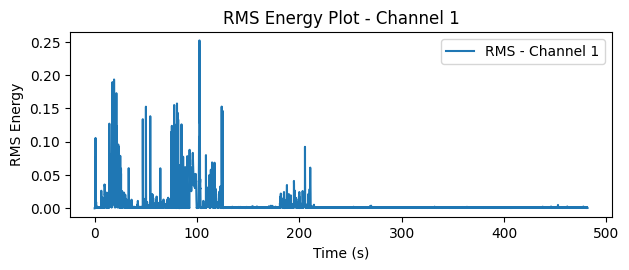

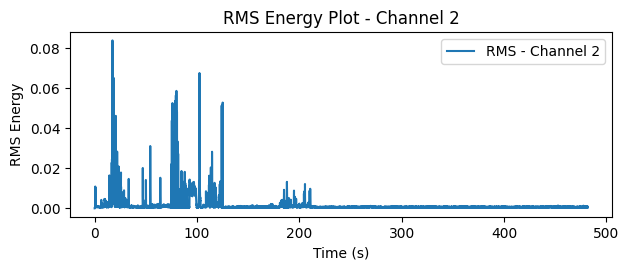

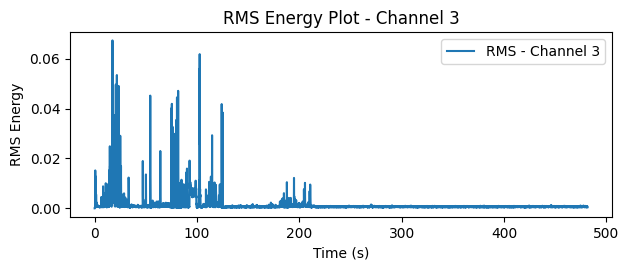

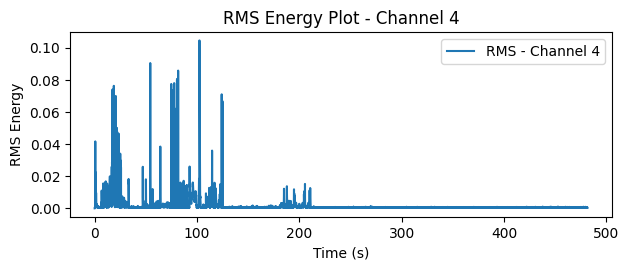

In [22]:
# GOPRO MAX

def plot_rms(audio_file_path):
    # Load the audio file with four channels
    y, sr = librosa.load(audio_file_path, mono=False)

    # Check if the audio has more than one channel
    if len(y.shape) > 1 and y.shape[0] == 4:
        # Generate time axis for the plot
        t = librosa.times_like(y[0, :])

        # Plot the RMS values for each channel separately
        for channel in range(y.shape[0]):
            # Calculate the RMS (Root Mean Square) over time for each channel
            rms = librosa.feature.rms(y=y[channel, :], frame_length=1024, hop_length=512)[0]

            # Plot the audio waveform
           # plt.figure(figsize=(12, 6))
           # plt.subplot(2, 1, 1)
           # librosa.display.waveshow(y[channel, :], sr=sr)
          # plt.title(f'Audio Waveform - Channel {channel + 1}')

            # Plot the RMS values for the current channel
            plt.subplot(2, 1, 2)
            plt.plot(t[:len(rms)], rms, label=f'RMS - Channel {channel + 1}')
            plt.xlabel('Time (s)')
            plt.ylabel('RMS Energy')
            plt.title(f'RMS Energy Plot - Channel {channel + 1}')
            plt.legend()

            plt.tight_layout()
            plt.show()
    else:
        print("The audio file does not have four channels.")


audio_file_path = './GP_GS010513_360_audio_1.wav'
plot_rms(audio_file_path)

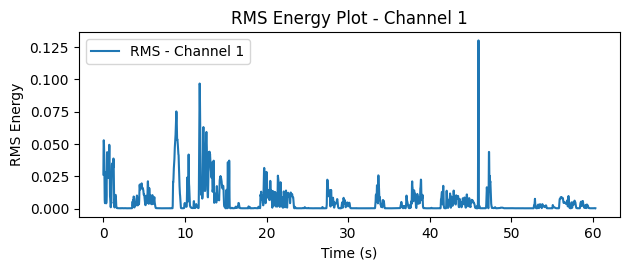

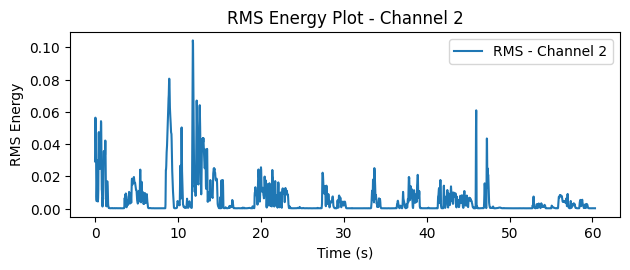

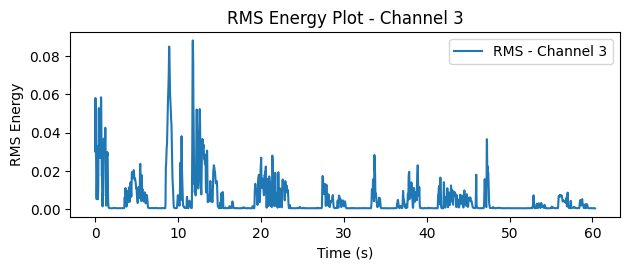

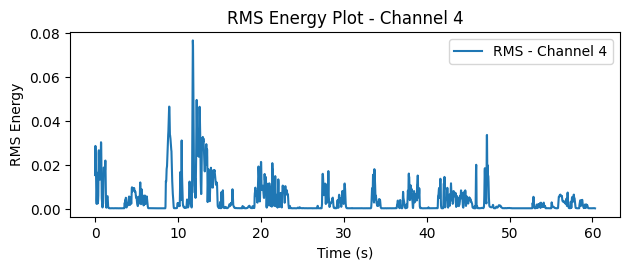

In [23]:
#INSTA360 X3

audio_file_path = './insta_AAC_20231218.aac'
plot_rms(audio_file_path)

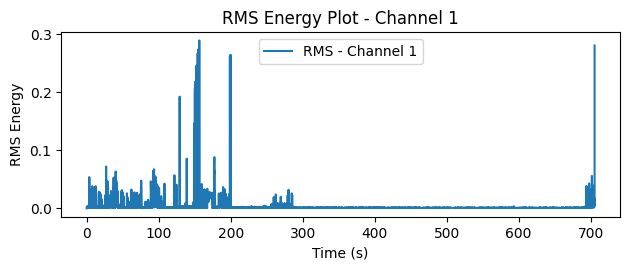

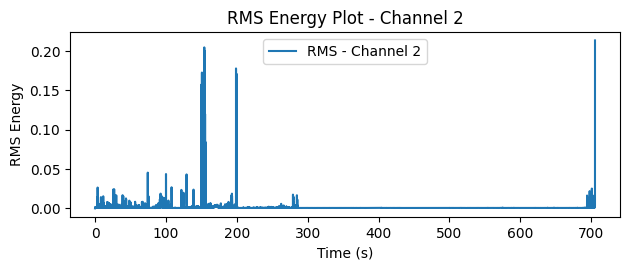

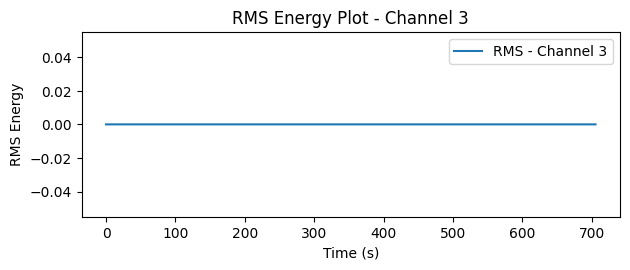

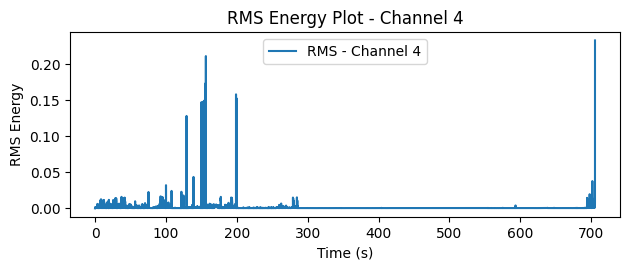

In [24]:
#GARMIN

audio_file_path = './Garmin_V1160176_mp4_audio.aac'
plot_rms(audio_file_path)

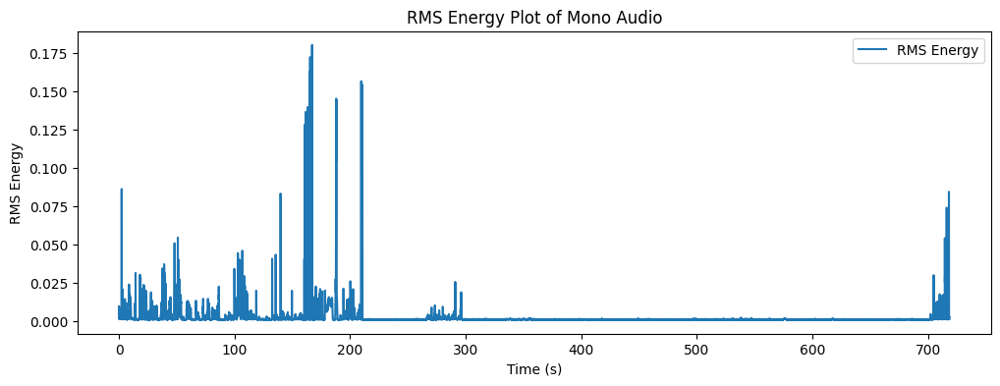

In [27]:
#RICOH

def plot_rms_mono(audio_file_path):
    y, sr = librosa.load(audio_file_path, mono=True)

    rms = librosa.feature.rms(y=y)[0]
    
    t = librosa.times_like(rms)
    
    plt.figure(figsize = (12, 4))
    plt.plot(t, rms, label = 'RMS Energy')
    plt.xlabel('Time (s)')
    plt.ylabel('RMS Energy')
    plt.title('RMS Energy Plot of Mono Audio')
    plt.legend()
    plt.show()
    
audio_file_path = './Ricoh_R0012328_mp4_audio.aac'
plot_rms_mono(audio_file_path)

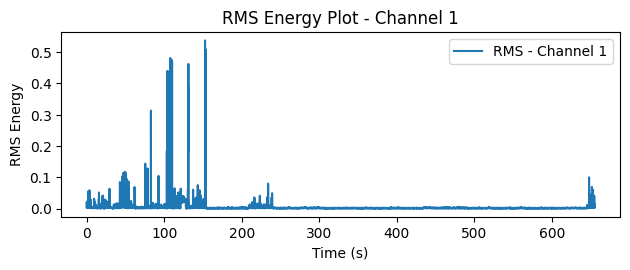

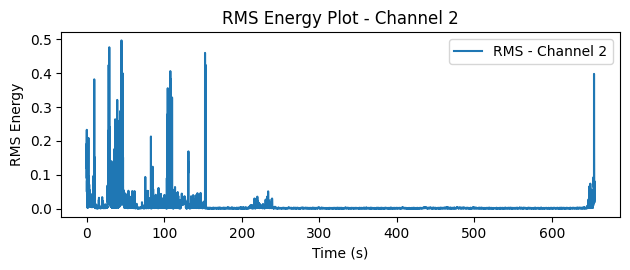

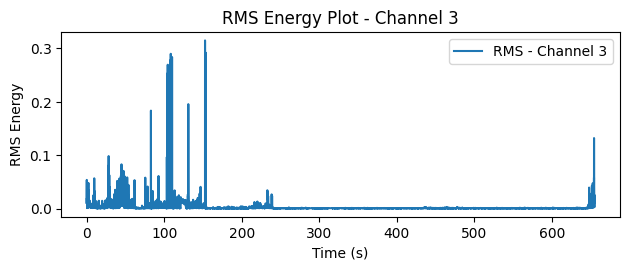

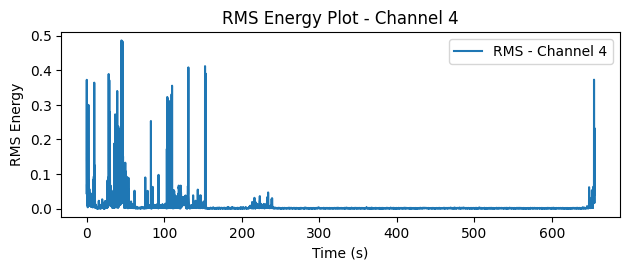

In [28]:
#ZOOM H3VR

audio_file_path = './Zoom_231218_003.wav'
plot_rms(audio_file_path)

In [193]:
# compute_anglegram
def compute_anglegram(
    audio_file_path,
    time_res=0.1,
    angular_res=1.0,
    azimuth_offset = 0.,
    start=0,
    duration=10,
    rms_threshold=-80,
    ):
    """
    Plot the angle map of the audio file
    :param audio_file_path: path to the audio file
    :param time_res: time resolution in seconds
    :param angular_res: angular resolution in degrees   
    :param azimuth_offset: offset in radians
    :param start: start time in seconds
    :param duration: duration in seconds
    :param rms_threshold: threshold in dB

    :return: time_record, phi_record, nu_record, rms_record
    """
    from source.ambisonics.distance import SphericalAmbisonicsVisualizer
    from math import pi
    # offset in seconds for each recording
    offsets = {
        "ricoh": 138,
        "garmin": 138 - 10.706,
        "insta": 138 - 39.197,
        "gopro": 138 - 85.545,
        "zoom": 138 - 56.988,
    }
    if start in offsets:
        start = offsets[start]

    y, sr = librosa.load(audio_file_path, mono=False, sr=None, offset=start, duration=duration)
    viz = SphericalAmbisonicsVisualizer(
        data=y.T,
        rate=sr,
        window=time_res,
        angular_res=angular_res,
        # ordering='FURSE_MALHAM',
        # normalization='MAX_N',
        )
    nu_mesh, phi_mesh = viz.mesh() # nu is elevation, phi is azimuth
    nu_mesh = nu_mesh[:, 0]
    phi_mesh = phi_mesh[0, :]
    nu_record, phi_record, time_record, rms_record = [], [], [], []
    # print(phi_mesh)

    # Get the maximum rms at each frame, and record its angle
    rms = viz.get_next_frame()
    time_record.append(0.)
    # time_record.append(0.+start)
    nu_max, phi_max = np.unravel_index(np.argmax(rms), rms.shape)
    nu_record.append(nu_mesh[nu_max])
    phi_record.append(phi_mesh[phi_max])
    rms_record.append(np.max(rms))

    while True:
        rms = viz.get_next_frame()
        if rms is None:
            break
        time_record.append(time_record[-1] + time_res)
        rms_record.append(np.max(rms))
        # find the loudest point
        nu_max, phi_max = np.unravel_index(np.argmax(rms), rms.shape)
        nu_record.append(nu_mesh[nu_max])
        phi_record.append(phi_mesh[phi_max])

    # apply phase offset and unwrapping to azimuth
    # phi_record = np.unwrap(np.array(phi_record) + azimuth_offset, period=2*np.pi)

    rms_record = np.array(rms_record)
    return {"time_record": np.array(time_record)[rms_record>rms_threshold],
            "phi_record": np.array(phi_record)[rms_record>rms_threshold],
            "nu_record": np.array(nu_record)[rms_record>rms_threshold],
            "rms_record": librosa.amplitude_to_db(rms_record)[rms_record>rms_threshold]}

In [224]:
audio_file_path = '../data/concat/gopro_WAV_360.wav'
results_gopro = compute_anglegram(audio_file_path, start="gopro", duration=52)

In [189]:
audio_file_path = '../data/concat/Zoom_231218_003.wav'
results_zoom = compute_anglegram(audio_file_path, start="zoom", duration=52)

In [220]:
# plot anglegram
def plot_anglegram(result_dict, db_threshold=-50, azimuth_line_start=-np.pi, duration=None):
    phi_record = result_dict["phi_record"]
    nu_record = result_dict["nu_record"]
    rms_record = result_dict["rms_record"]
    time_record = result_dict["time_record"]
    with plt.style.context(['science', 'no-latex']):
        fig, ax = plt.subplots(2, 1, figsize=(7, 3), dpi=600)
        fig.suptitle('Anglegram of Zoom H3VR', y=0.515, ha='center', x=0.45)

        if duration is not None:
            phi_record_ = phi_record[time_record<duration]
            nu_record_ = nu_record[time_record<duration]
            rms_record_ = rms_record[time_record<duration]
            time_record_ = time_record[time_record<duration]
        else:
            phi_record_ = phi_record
            nu_record_ = nu_record
            rms_record_ = rms_record
            time_record_ = time_record

        sc = ax[0].scatter(
            time_record_[rms_record_>db_threshold],
            phi_record_[rms_record_>db_threshold],
            c=rms_record_[rms_record_>db_threshold],
            label='Azimuth',
            alpha=0.9,
            )
        ax[0].set_yticks([-np.pi, 0, np.pi])
        ax[0].set_yticklabels(["   $-\pi$", "$0$", "$\pi$"])
        # ax[0].set_yticklabels([f'{2*i}$\pi$' for i in range(int(np.max(phi_record)/(2*np.pi))+1)])
        ax[0].set(ylabel='Azimuth', xticklabels=[])

        # horizontal lines
        ax[0].axhline(y=0, linestyle='--', alpha=0.3)
        for i in [-np.pi, np.pi]:
            ax[0].axhline(y=i, linestyle='-', color="black", alpha=0.5)
        ax[0].grid(axis='x')

        sc = ax[1].scatter(
            time_record_[rms_record_>db_threshold],
            -nu_record_[rms_record_>db_threshold], # flip
            c=rms_record_[rms_record_>db_threshold],
            label='Elevation',
            alpha=0.9
            )
        ax[1].set(xlabel='Time (s)', ylabel='Elevation', ylim=(-0.5*np.pi-0.1, 0.5*np.pi+0.1))
        ax[1].grid(axis='x')
        ax[1].set_yticks([-0.5*np.pi, -0.25*np.pi, 0, 0.25*np.pi, 0.5*np.pi])
        ax[1].set_yticklabels([r'$-\pi/2$', r'$-\pi/4$', r'$0$', r'$\pi/4$', r'$\pi/2$'])
        # horizontal lines on pi
        line_start = -1 * np.pi
        while line_start < np.max(nu_record):
            ax[1].axhline(y=line_start, linestyle='--', alpha=0.3)
            line_start += np.pi
        # horizontal lines on 2pi
        line_start = -1 * np.pi
        while line_start < np.max(phi_record):
            ax[1].axhline(y=line_start, linestyle='-', color="black", alpha=0.5)
            line_start += 2*np.pi
        
        cb = fig.colorbar(sc, ax=ax, aspect=30)
        cb.set_label('RMS (dB)', rotation=0, y=-0.1, labelpad=-20)

        plt.show()

In [266]:
# plot two anglegrams
def plot_2anglegrams(
    result_dict_1, result_dict_2,
    title_1, title_2,
    db_threshold_1=-50, db_threshold_2=-50,
    figsize=(7,3),
    azimuth_line_start=-np.pi,
    duration=None,
    dpi=600
    ):

    with plt.style.context(['science', 'no-latex']):
        fig, ax = plt.subplots(2, 2, figsize=figsize, dpi=dpi)
        for i in range(2):
            if i == 0:
                phi_record = result_dict_1["phi_record"]
                nu_record = result_dict_1["nu_record"]
                rms_record = result_dict_1["rms_record"]
                time_record = result_dict_1["time_record"]
                ax[0, i].set_title(title_1)
                db_threshold = db_threshold_1
            elif i == 1:
                phi_record = result_dict_2["phi_record"]
                nu_record = result_dict_2["nu_record"]
                rms_record = result_dict_2["rms_record"]
                time_record = result_dict_2["time_record"]
                ax[0, i].set_title(title_2)
                db_threshold = db_threshold_2

            if duration is not None:
                phi_record_ = phi_record[time_record<duration]
                nu_record_ = nu_record[time_record<duration]
                rms_record_ = rms_record[time_record<duration]
                time_record_ = time_record[time_record<duration]
            else:
                phi_record_ = phi_record
                nu_record_ = nu_record
                rms_record_ = rms_record
                time_record_ = time_record

            sc = ax[0, i].scatter(
                time_record_[rms_record_>db_threshold],
                phi_record_[rms_record_>db_threshold],
                c=rms_record_[rms_record_>db_threshold],
                label='Azimuth',
                alpha=0.9,
                )
            ax[0, i].set_yticks([-np.pi, 0, np.pi])
            ax[0, i].set_yticklabels(["   $-\pi$", "$0$", "$\pi$"])
            # ax[0].set_yticklabels([f'{2*i}$\pi$' for i in range(int(np.max(phi_record)/(2*np.pi))+1)])
            ax[0, i].set(ylabel='Azimuth', xticklabels=[])

            # horizontal lines
            ax[0, i].axhline(y=0, linestyle='--', alpha=0.3)
            for j in [-np.pi, np.pi]:
                ax[0, i].axhline(y=j, linestyle='-', color="black", alpha=0.5)
            ax[0, i].grid(axis='x')

            sc = ax[1, i].scatter(
                time_record_[rms_record_>db_threshold],
                -nu_record_[rms_record_>db_threshold], # flip
                c=rms_record_[rms_record_>db_threshold],
                label='Elevation',
                alpha=0.9
                )
            ax[1, i].set(xlabel='Time (s)', ylabel='Elevation', ylim=(-0.5*np.pi-0.1, 0.5*np.pi+0.1))
            ax[1, i].grid(axis='x')
            ax[1, i].set_yticks([-0.5*np.pi, -0.25*np.pi, 0, 0.25*np.pi, 0.5*np.pi])
            ax[1, i].set_yticklabels([r'$-\pi/2$', r'$-\pi/4$', r'$0$', r'$\pi/4$', r'$\pi/2$'])
            # horizontal lines on pi
            line_start = -1 * np.pi
            while line_start < np.max(nu_record):
                ax[1, i].axhline(y=line_start, linestyle='--', alpha=0.3)
                line_start += np.pi
            # horizontal lines on 2pi
            line_start = -1 * np.pi
            while line_start < np.max(phi_record):
                ax[1, i].axhline(y=line_start, linestyle='-', color="black", alpha=0.5)
                line_start += 2*np.pi
        
            ax[0, 1].set(ylabel="")
            ax[1, 1].set(ylabel="")
        cb = fig.colorbar(sc, ax=ax, aspect=10)
        cb.set_label('RMS (dB)', rotation=0, y=-0.1, labelpad=-20)

        plt.show()

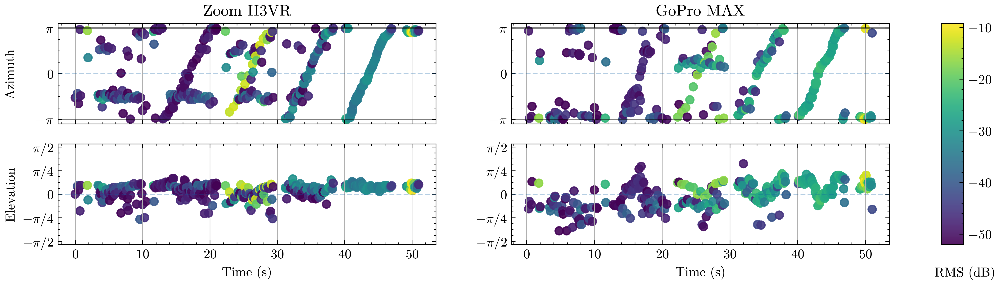

In [268]:
plot_2anglegrams(results_zoom, results_gopro, "Zoom H3VR", "GoPro MAX", -45, -52, figsize=(14, 3), dpi=500)

In [20]:
# !ffprobe "../data/concat/V1160176/V1160176.mp4" -hide_banner
!ffmpeg -i "../data/concat/V1160176/V1160176.mp4" -vn -acodec copy "../data/concat/Garmin_software_export.m4a"


ffmpeg version 6.1.1 Copyright (c) 2000-2023 the FFmpeg developers
  built with Apple clang version 15.0.0 (clang-1500.1.0.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/6.1.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libopen

In [5]:
!ffprobe "../data/original/garmin/V1160176.MP4" -hide_banner

Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '../data/original/garmin/V1160176.MP4':
  Metadata:
    major_brand     : mp41
    minor_version   : 538120216
    compatible_brands: mp41
    creation_time   : 2020-07-13T22:13:15.000000Z
  Duration: 00:11:45.60, start: 0.000000, bitrate: 80341 kb/s
  Stream #0:0[0x1](eng): Video: h264 (High) (avc1 / 0x31637661), yuv420p(tv, bt709, progressive), 3840x2160 [SAR 1:1 DAR 16:9], 80014 kb/s, 25 fps, 25 tbr, 25k tbn (default)
    Metadata:
      creation_time   : 2020-07-13T22:13:15.000000Z
      handler_name    : Garmin AVC
      vendor_id       : [0][0][0][0]
      encoder         : AVC Coding
    Side data:
      spherical: equirectangular (0.000000/0.000000/0.000000) 
  Stream #0:1[0x2](eng): Audio: aac (LC) (mp4a / 0x6134706D), 48000 Hz, 4.0, fltp, 320 kb/s (default)
    Metadata:
      creation_time   : 2020-07-13T22:13:15.000000Z
      handler_name    : Garmin AAC
      vendor_id       : [0][0][0][0]


In [8]:
!ffprobe "../data/original/ricoh/R0012328_st.MP4" -hide_banner

Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '../data/original/ricoh/R0012328_st.MP4':
  Metadata:
    major_brand     : mp42
    minor_version   : 1
    compatible_brands: isommp41mp42
    creation_time   : 2023-12-18T16:37:40.000000Z
  Duration: 00:11:58.72, start: 0.000000, bitrate: 16123 kb/s
  Stream #0:0[0x1](und): Video: h264 (Constrained Baseline) (avc1 / 0x31637661), yuvj420p(pc, progressive), 1920x960, 15991 kb/s, 29.97 fps, 29.97 tbr, 600 tbn (default)
    Metadata:
      creation_time   : 2023-12-18T16:37:40.000000Z
      handler_name    : Core Media Video
      vendor_id       : [0][0][0][0]
    Side data:
      spherical: equirectangular (0.000000/0.000000/0.000000) 
  Stream #0:1[0x2](und): Audio: aac (LC) (mp4a / 0x6134706D), 44100 Hz, mono, fltp, 124 kb/s (default)
    Metadata:
      creation_time   : 2023-12-18T16:37:40.000000Z
      handler_name    : Core Media Audio
      vendor_id       : [0][0][0][0]


In [3]:
!ffprobe "../data/original/garmin/V1160176.THM" -hide_banner

Input #0, jpeg_pipe, from '../data/original/garmin/V1160176.THM':
  Duration: N/A, bitrate: N/A
  Stream #0:0: Video: mjpeg (Baseline), yuvj422p(pc, bt470bg/unknown/unknown), 384x216 [SAR 1:1 DAR 16:9], 25 fps, 25 tbr, 25 tbn


In [3]:
zoom, sr_zoom = librosa.load('../data/concat/Zoom_231218_003.wav', sr=None)
gopro, sr_gopro = librosa.load('../data/concat/gopro_WAV_360.wav', sr=None)
insta, sr_insta = librosa.load('../data/concat/insta_AAC_20231218.aac', sr=None)
garmin, sr_garmin = librosa.load('../data/concat/Garmin_V1160176_mp4_audio.aac', sr=None)
ricoh, sr_ricoh = librosa.load('../data/concat/Ricoh_R0012328_mp4_audio.aac', sr=48000)

/var/folders/9_/p2rkm3qd5m31j12d1gl__xz80000gn/T/ipykernel_27511/586325110.py:3: UserWarning: PySoundFile failed. Trying audioread instead.
  insta, sr_insta = librosa.load('../data/concat/insta_AAC_20231218.aac', sr=None)
/Users/guojinyue/Library/Python/3.9/lib/python/site-packages/librosa/core/audio.py:183: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
/var/folders/9_/p2rkm3qd5m31j12d1gl__xz80000gn/T/ipykernel_27511/586325110.py:4: UserWarning: PySoundFile failed. Trying audioread instead.
  garmin, sr_garmin = librosa.load('../data/concat/Garmin_V1160176_mp4_audio.aac', sr=None)
/var/folders/9_/p2rkm3qd5m31j12d1gl__xz80000gn/T/ipykernel_27511/586325110.py:5: UserWarning: PySoundFile failed. Trying audioread instead.
  ricoh, sr_ricoh = librosa.load('../data/concat/Ricoh_R0012328_mp4_audio.aac', sr=48000)


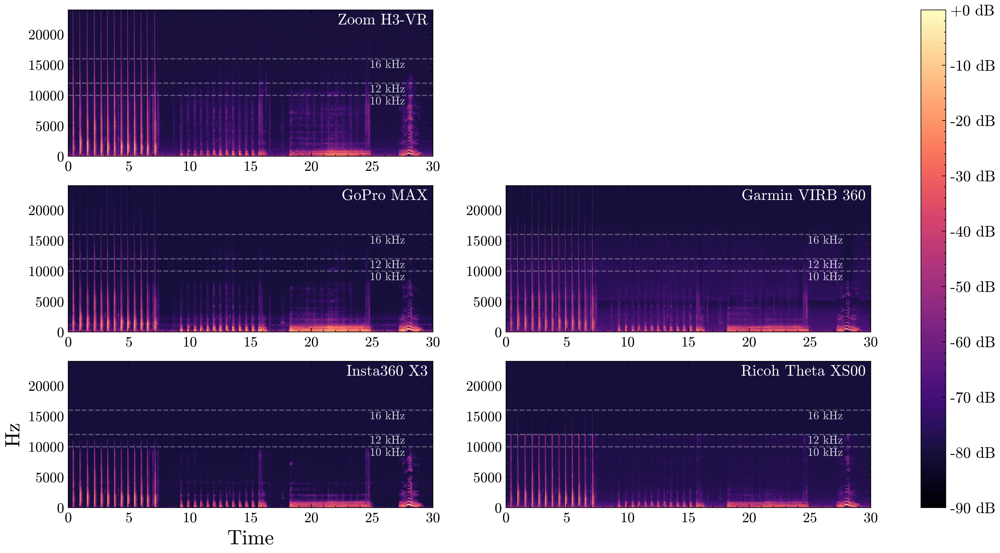

In [337]:
data = {
    # audio, sr, model name, time offset, db offset, ax
    "zoom": (zoom, sr_zoom, "Zoom H3-VR ", 0. - 56.988, 0, [0,0]),
    "gopro": (gopro, sr_gopro, "GoPro MAX ", 0. - 85.545, 0, [1,0]),
    "insta": (insta, sr_insta, "Insta360 X3 ", 0. - 39.197, 0, [2,0]),
    "garmin": (garmin, sr_garmin, "Garmin VIRB 360 ", 0. - 10.706, 0, [1,1]),
    "ricoh": (ricoh, sr_ricoh, "Ricoh Theta XS00 ", 0., 0, [2,1]),
}
start = 160
duration = 30
hop_length = 128
n_fft = 1024
n_mels = 300
fmax = 24000
vmin = -90

with plt.style.context(['science', 'no-latex']):
    fig, ax = plt.subplots(3, 2, figsize=(14, 7), dpi=800)
    for device in data:
        start_, end_ = int((start+data[device][3])*data[device][1]), int((start+data[device][3]+duration)*data[device][1])
        # mel
        # img = librosa.display.specshow(
        #     librosa.power_to_db(
        #         librosa.feature.melspectrogram(y=data[device][0][start_:end_], sr=data[device][1], n_mels=n_mels, fmax=fmax)),
        #         y_axis='mel', sr=sr_zoom, x_axis='time', fmax=fmax, ax=ax[i])
        # log stft
        ax_current = ax[data[device][5][0], data[device][5][1]]
        img = librosa.display.specshow(
            librosa.amplitude_to_db(
                    np.abs(librosa.stft(data[device][0][start_:end_], n_fft=n_fft, hop_length=hop_length)),
                ref=np.max)+data[device][4],
            sr=data[device][1], hop_length=hop_length, x_axis='time', y_axis='linear', ax=ax_current, vmin=vmin)

        ax_current.axhline(y=10000, linestyle='--', alpha=0.3, color='white')
        ax_current.text(24.8, 8500, "10 kHz", color='white', fontsize=9, ha='left', alpha=0.8)
        ax_current.axhline(y=12000, linestyle='--', alpha=0.3, color='white')
        ax_current.text(24.8, 10500, "12 kHz", color='white', fontsize=9, ha='left', alpha=0.8)
        ax_current.axhline(y=16000, linestyle='--', alpha=0.3, color='white')
        ax_current.text(24.8, 14500, "16 kHz", color='white', fontsize=9, ha='left', alpha=0.8)
        ax_current.set(ylim=(0, 24000))
        ax_current.tick_params(axis='both', which='major', labelsize=11.2)
        ax_current.set_title(data[device][2], y=0.85, color='white', loc='right')
        if device != "insta":
            ax_current.set(xlabel="", ylabel="")
        ax_current.xaxis.label.set_size(16)
        ax_current.yaxis.label.set_size(16)


    ax[0, 1].set_visible(False)
    cb = fig.colorbar(img, ax=ax, format="%+2.f dB")
    cb.ax.tick_params(labelsize=12)
    plt.show()

In [25]:
data = {
    # audio, sr, model name, time offset, db offset, ax
    "zoom": (zoom, sr_zoom, "Zoom H3-VR ", 0. - 56.988, 0, [0,0]),
    "gopro": (gopro, sr_gopro, "GoPro MAX ", 0. - 85.545, 0, [1,0]),
    "insta": (insta, sr_insta, "Insta360 X3 ", 0. - 39.197, 0, [2,0]),
    "garmin": (garmin, sr_garmin, "Garmin VIRB 360 ", 0. - 10.706, 0, [1,1]),
    "ricoh": (ricoh, sr_ricoh, "Ricoh Theta S ", 0., 0, [2,1]),
}
start = 160
duration = 30
hop_length = 128
n_fft = 1024
n_mels = 300
fmax = 24000
vmin = -90

with plt.style.context(['science', 'no-latex']):
    fig, ax = plt.subplots(5, 1, figsize=(7, 14), dpi=400)
    for i, device in enumerate(data):
        start_, end_ = int((start+data[device][3])*data[device][1]), int((start+data[device][3]+duration)*data[device][1])
        # mel
        # img = librosa.display.specshow(
        #     librosa.power_to_db(
        #         librosa.feature.melspectrogram(y=data[device][0][start_:end_], sr=data[device][1], n_mels=n_mels, fmax=fmax)),
        #         y_axis='mel', sr=sr_zoom, x_axis='time', fmax=fmax, ax=ax[i])
        # log stft
        ax_current = ax[i]
        img = librosa.display.specshow(
            librosa.amplitude_to_db(
                    np.abs(librosa.stft(data[device][0][start_:end_], n_fft=n_fft, hop_length=hop_length)),
                ref=np.max)+data[device][4],
            sr=data[device][1], hop_length=hop_length, x_axis='time', y_axis='linear', ax=ax_current, vmin=vmin)

        ax_current.axhline(y=10000, linestyle='--', alpha=0.3, color='white')
        ax_current.text(24.8, 8500, "10 kHz", color='white', fontsize=10, ha='left', alpha=0.8)
        ax_current.axhline(y=12000, linestyle='--', alpha=0.3, color='white')
        ax_current.text(24.8, 10500, "12 kHz", color='white', fontsize=10, ha='left', alpha=0.8)
        ax_current.axhline(y=16000, linestyle='--', alpha=0.3, color='white')
        ax_current.text(24.8, 14500, "16 kHz", color='white', fontsize=10, ha='left', alpha=0.8)
        ax_current.set(ylim=(0, 24000))
        ax_current.tick_params(axis='both', which='major', labelsize=10)
        ax_current.set_title(data[device][2], y=0.85, color='white', loc='right', fontsize=16)
        if device != "ricoh":
            ax_current.set(xlabel="", ylabel="")
        ax_current.xaxis.label.set_size(16)
        ax_current.yaxis.label.set_size(16)


    # ax[0, 1].set_visible(False)
    cb = fig.colorbar(img, ax=ax, format="%+2.f dB", location="right", fraction=0.05, aspect=10, anchor=(0, 0))
    # cb = fig.colorbar(img, ax=ax, format="%+2.f dB", location="top")
    cb.ax.tick_params(labelsize=12)
    plt.show()

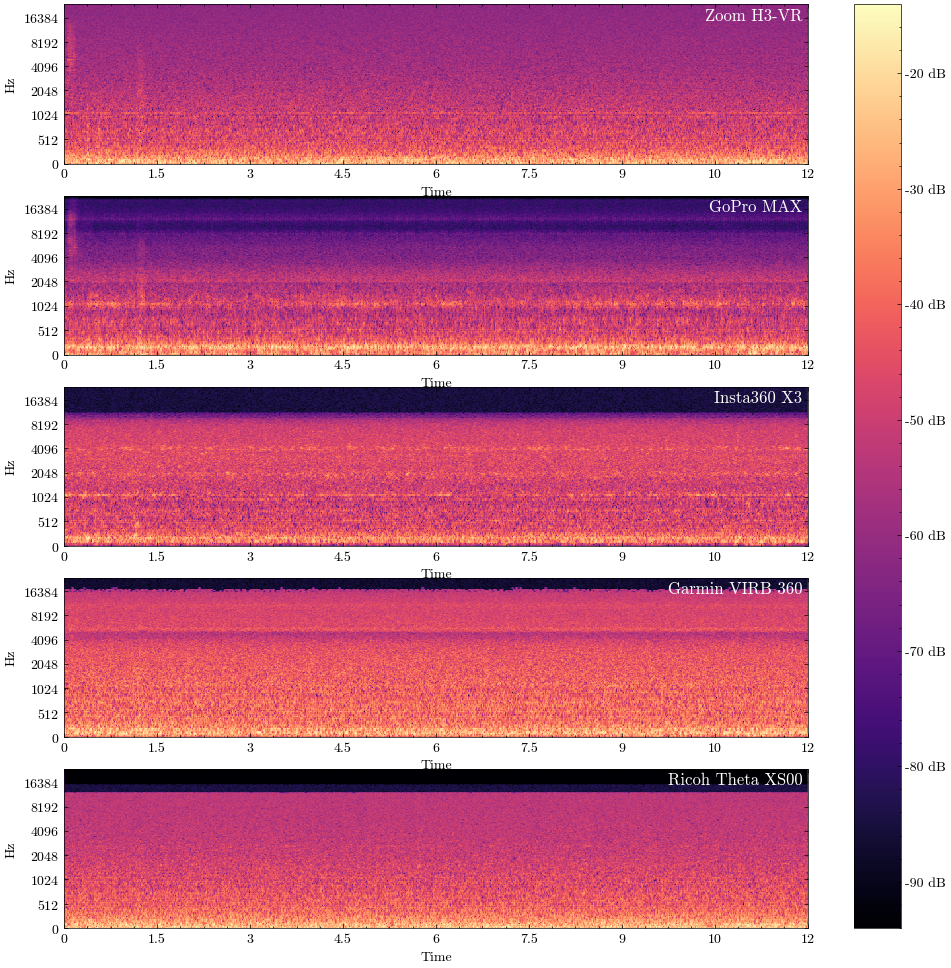

In [120]:
data = {
    # audio, sr, model name, time offset, db offset
    "zoom": (zoom, sr_zoom, "Zoom H3-VR ", 0. - 56.988, 0),
    "gopro": (gopro, sr_gopro, "GoPro MAX ", 0. - 85.545, 0),
    "insta": (insta, sr_insta, "Insta360 X3 ", 0. - 39.197, -20),
    "garmin": (garmin, sr_garmin, "Garmin VIRB 360 ", 0. - 10.706, 0),
    "ricoh": (ricoh, sr_ricoh, "Ricoh Theta XS00 ", 0., -15),
}
start = 300
duration = 12
hop_length = 128
n_fft = 2048
n_mels = 256
fmax = 24000

with plt.style.context(['science', 'no-latex']):
    fig, ax = plt.subplots(5, 1, figsize=(12, 12))
    for i, device in enumerate(data):
        start_, end_ = int((start+data[device][3])*data[device][1]), int((start+data[device][3]+duration)*data[device][1])
        # mel
        img = librosa.display.specshow(
            librosa.power_to_db(
                librosa.feature.melspectrogram(y=data[device][0][start_:end_], sr=data[device][1], n_mels=n_mels, fmax=fmax)),
                y_axis='mel', sr=sr_zoom, x_axis='time', fmax=fmax, ax=ax[i])
        # log stft
        # img = librosa.display.specshow(
        #     librosa.amplitude_to_db(
        #         np.abs(librosa.stft(data[device][0][start_:end_], n_fft=n_fft, hop_length=hop_length)))+data[device][4],
        #         sr=data[device][1], hop_length=hop_length, x_axis='time', y_axis='linear', ax=ax[i], vmin=-70)

        # ax[i].axhline(y=10000, linestyle='--', alpha=0.3, color='white')
        # ax[i].text(12, 8500, "10 kHz", color='white', fontsize=8, ha='right')
        # ax[i].axhline(y=12000, linestyle='--', alpha=0.3, color='white')
        # ax[i].text(12, 10500, "12 kHz", color='white', fontsize=8, ha='right')
        # ax[i].axhline(y=16000, linestyle='--', alpha=0.3, color='white')
        # ax[i].text(12, 14500, "16 kHz", color='white', fontsize=8, ha='right')
        ax[i].set(ylim=(0, fmax))
        ax[i].set_title(data[device][2], y=0.85, color='white', loc='right')

    fig.colorbar(img, ax=ax, format="%+2.f dB")
    plt.show()